# DSCI510 Fall 2020 Final Project

## Questions

### 1. Name:
Olivia Fryt

### 2. "Gotchas":
I don't feel as if there are any major issues with my project. The scraping is a bit slow (I believe primarily due to the necessary "sleeps" to avoid being blocked by the websites) yet I did attempt to handle this with multiprocessing. Additionally, the identification of facial landmarks is not 100% accurate. This can be due to photos with busy backgrounds, small/pixelated faces, makeup, and face perspective (if the candidate's face is turned slightly to the right or left).

### 3. Requirements
This project is separated into three clear parts:
1. collection
2. transformation
3. analysis

The "collection" part of the project was submitted as Milestone 2 and the "analysis" part of the project is included in this Milestone 3 submission. The "transformation" part is an intermediate step that preprocesses the contestants' face photos and evaluates the faces' measurements for three algorithms: the rule of thirds, the rule of fifths, and the golden ratio.

The following packages are required for "collection": pandas, pytz, bs4, and requests

The following packages are required for "analysis": pandas, numpy, matplotlib, and seaborn

The transformation part of the project is best run in a Docker container built with the provided Dockerfile. IE:
```
docker build . --tag bach
docker run --volume $(pwd):/home/ bach transform.py
```

### 4. Other Relevant Points
I spent a lot of time on (and very much so enjoyed working on) the transformation code which, though was not required in any of the milestones for this project, was integral to quantifying contestants' attractiveness for this analysis. This code preprocesses contestants' photos (retrieved from either the Bachelor Nation Wiki or Instagram) by finding the contestants' face in the photo, rotating the photo to the place where the contestants' eyes are perfectly horizontal, cropping the photo such that it only includes the contestants' face, and resizing the photo so that photo height is consistent throughout the entire data set. It also evaluates the results of the rule of thirds, rule of fifths, and golden ratio for each preprocessed photo with the help of dlib.

### Project Conclusions
##### 5.	What did you set out to study?
The original sole purpose of my study was to see (1) if a correlation exists between a contestant's general facial attractiveness (as defined by classic algorithms such as the rule of thirds, rule of fifths, and golden ratio) and their week of elimination (which is better quantified throughtout the study as "place"). However, after spending some more time with the data I also recognized that I could add two additional inquiries to my study: (2) if a correlation exists between a contestant's general facial attractiveness and their popularity ("followers") and public engagement ("average photo likes") on Instagram and (3) if a correlation exists between a contestant's popularity/public engagement on Instagram and the week of their elimination ("place").

##### 7.	What did you Discover/what were your conclusions (i.e. what were your findings?  Were your original assumptions confirmed, etc.?)
In conclusion, I found that:
1. Place was not correlated with contestants' facial attractiveness. This surprised me simply because of the reputations of The Bachelor and The Bachelorette shows. Maybe this shows that the bachelor/bachelorette from each season truly do create strong emotional bonds with specific contestants.
2. A contestant's facial attractiveness seems to have some correlation with their Instagram popularity and engagement. It seems that the error ratios of the rule of thirds results are the facial attractiveness variables that are most highly correlated to Instagram popularity and engagement, though it interestingly seems that higher error ratios were seen in contestants with higher followers and average photo likes. This is the opposite of the outcome I expected.
3. A contestant's popularity on Instagram was not correlated with the week of their elimination. This really surprised me because contestants who were eliminated in later weeks (therefore receiving higher "places") inherently received more time on the show and in turn more publicity. I assumed that this fact would have resulted in contestants who received higher places also receiving more public interest on Instagram. One reason I can think of as to why this might not be the case is because my study did not look at any of the other offshoot shows outside of The Bachelor and The Bachelorette, particularly those that invite-back previous contestants from The Bachelor and The Bachelorette, such as Bachelor in Paradise. Additional publicity from these kinds of shows may lead to a contestant's increased social media popularity.
4. Separating the contestants by show, and therefore by gender (The Bachelor with all female contestants and The Bachelorette with all male contestants), still yielded no correlation between any of the previously proposed variables. I believed gender may have played a role in the lack of correlation when dealing with contestants' facial attractiveness simply due to societal gender roles and the implications of such.

##### 8.	What difficulties did you have in completing the project?  
I had three main challenges with this project:
1. I found that height information was only reported on the source website for my data set 3 for contestants from very few seasons. I ultimately opted ignore height in the analysis because a majority of the contestants' height information was missing from the data set.
2. On September 29, 2020 Instagram deprecated their Legacy API that allowed Instagram developers to query for public users. This was a problem for me because I intended to use applicable contestants' Instagram profile pictures as their face analysis photos in the case of their headshots from the show not working well with my transformation logic as well as because I also wanted to look for a correlation between contestants' attractiveness and popularity on Instagram. I was able to solve this, however, by finding and using an undocumented Instagram API endpoint.
3. This was my first time learning about dlib, which I used in my transformation process to help find, rotate, and crop contestants' faces from their show photos. As such, some of the preprocessed faces are not accurate. I was able to decrease the error over time, but it is not 100% accurate.

##### 9.	What skills did you wish you had while you were doing the project?
I would have found some additional knowledge about analysis to be helpful. Specifically, I would have liked to better understand what kinds of interesting observations to look for in the data and the best ways to look for them as well as correlation, regression, and the difference between the two.

##### 10.	What would you do “next” to expand or augment the project?
My next steps for this project would most likely be to attempt to find another source for more contestants' Instagram accounts (my current source only had about 178 contestants' Instagram accounts listed), to expand my scope of social media platforms, and to expand my scope to the Bachelor offshoot shows. Later, it might be interesting to implement some machine learning as well -- maybe to help identify contestants' faces and their features in their photos.

## Analysis

In [1]:
import sys
sys.path.append("..")
#!{sys.executable} -m pip install --user pandas
import pandas as pd
import numpy as np
import model
import os

# Path to the data
PATH_TO_VOLUME = os.path.join(os.getcwd(), '..', 'data')

# Model object
bachmodel = model.bachmodel(PATH_TO_VOLUME)

### Data Exploration and Visualization

In [2]:
# Read-in and explore each data set

#!{sys.executable} -m pip install --user matplotlib seaborn
import matplotlib.pyplot as plt
import seaborn as sns
import json

def get_ds(ds):
    df = bachmodel.retrieve_df(ds)
    print(f'Data Model: {json.dumps(bachmodel.models[ds], indent=2)}\n')
    print(f'DF Description:\n{df.describe()}\n')
    return df

Data Model: {
  "season": -1,
  "original_run": "",
  "suitor": "",
  "winner": "",
  "runnersup": "",
  "proposal": -1,
  "show": -1,
  "still_together": -1,
  "relationship_notes": ""
}

DF Description:
          season   proposal       show  still_together
count  44.000000  44.000000  44.000000       44.000000
mean   11.613636   0.659091   0.386364        0.090909
std     6.807028   0.568277   0.492545        0.421414
min     1.000000  -1.000000   0.000000       -1.000000
25%     6.000000   0.000000   0.000000        0.000000
50%    11.000000   1.000000   0.000000        0.000000
75%    16.000000   1.000000   1.000000        0.000000
max    25.000000   1.000000   1.000000        1.000000

Missing Values:


<AxesSubplot:>

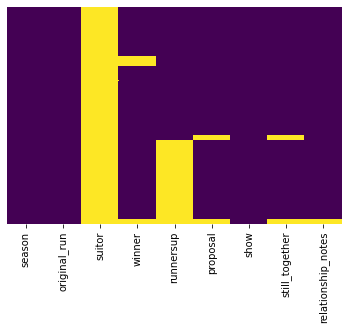

In [3]:
# Explore data set 1

ds1 = get_ds(1)
# Check for missing values
print('Missing Values:')
# Replace null values with NaN
null_vals = list(set(bachmodel.models[1].values()))
for val in null_vals:
    ds1 = ds1.replace(val, np.nan)
sns.heatmap(ds1.isnull(), cbar=False, yticklabels=False, cmap='viridis')

Data Model: {
  "id": "",
  "name": "",
  "age": -1,
  "hometown": "",
  "occupation": "",
  "eliminated": "",
  "season": -1,
  "show": -1,
  "profile_url": "",
  "place": -1
}

DF Description:
              age      season        show       place
count  931.000000  931.000000  931.000000  931.000000
mean    27.613319   12.034372    0.461869   12.290011
std      3.436802    6.529577    0.498812    6.728027
min     -1.000000    1.000000    0.000000    1.000000
25%     25.000000    7.000000    0.000000    7.000000
50%     27.000000   12.000000    0.000000   12.000000
75%     30.000000   16.000000    1.000000   17.000000
max     42.000000   24.000000    1.000000   32.000000

Missing Values:


<AxesSubplot:>

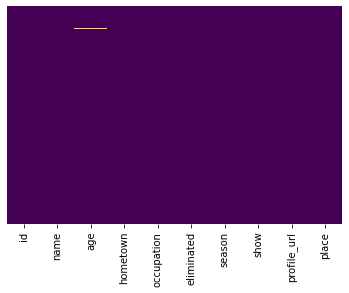

In [4]:
# Explore data set 2

ds2 = get_ds(2)
print('Missing Values:')
# Replace null values with NaN
null_vals = list(set(bachmodel.models[2].values()))
for val in null_vals:
    ds2 = ds2.replace(val, np.nan)
sns.heatmap(ds2.isnull(), cbar=False, yticklabels=False, cmap='viridis')

Data Model: {
  "id": "",
  "name": "",
  "photo": "",
  "profile_url": "",
  "born": "",
  "hometown": "",
  "occupation": "",
  "seasons": "",
  "social_media": [],
  "height": ""
}

DF Description:
                                          id         name  \
count                                    931          931   
unique                                   931          920   
top     069f95db-51ec-4b01-8baf-760e4b16e8ff  Amber James   
freq                                       1            2   

                                                    photo  \
count                                                 931   
unique                                                768   
top     data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAA...   
freq                                                  156   

                                              profile_url  born  \
count                                                 931   931   
unique                                               

<AxesSubplot:>

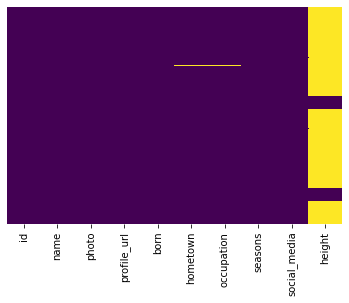

In [5]:
# Explore data set 3

ds3 = get_ds(3)
print('Missing Values:')
# Replace null values with NaN
null_vals = list(set([v for k, v in bachmodel.models[3].items() if k != 'social_media']))
for val in null_vals:
    ds3 = ds3.replace(val, np.nan)
# Account for unhashable type
ds3copy = ds3.copy()
ds3copy['social_media'] = ds3copy['social_media'].apply(lambda x: '' if x == [] else 'instagram')
sns.heatmap(ds3.isnull(), cbar=False, yticklabels=False, cmap='viridis')

Data Model: {
  "id": "",
  "followers": -1,
  "following": -1,
  "is_private": -1,
  "name": "",
  "photo1": "",
  "photo1_comments": -1,
  "photo1_likes": -1,
  "photo1_comments_disabled": -1,
  "photo1_timestamp": "",
  "photo2": "",
  "photo2_comments": -1,
  "photo2_likes": -1,
  "photo2_comments_disabled": -1,
  "photo2_timestamp": "",
  "photo3": "",
  "photo3_comments": -1,
  "photo3_likes": -1,
  "photo3_comments_disabled": -1,
  "photo3_timestamp": "",
  "post_count": -1,
  "prof_photo": "",
  "url": "",
  "user_id": "",
  "username": ""
}

DF Description:
          followers    following  is_private  photo1_comments   photo1_likes  \
count  1.780000e+02   178.000000  178.000000       178.000000     178.000000   
mean   3.176654e+05  1119.735955    0.033708       172.078652   12321.162921   
std    4.782023e+05   979.659259    0.180985       547.660225   27703.632850   
min    0.000000e+00     0.000000    0.000000        -1.000000      -1.000000   
25%    2.174200e+04   597.0

<AxesSubplot:>

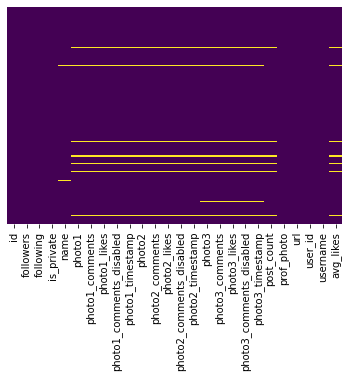

In [11]:
# Explore data set 4

def avg(likes1, likes2, likes3):
    total = 0
    count = 0
    if likes1 > -1:
        total += likes1
        count += 1
    if likes2 > -1:
        total += likes2
        count += 1
    if likes3 > -1:
        total += likes3
        count += 1
    if count > 0:
        return total/count
    else:
        return -1

ds4 = get_ds(4)
# Evaluate average photo likes
ds4['avg_likes'] = ds4.apply(lambda row: avg(row['photo1_likes'], row['photo2_likes'], row['photo3_likes']), axis=1)
bachmodel.models[4]['avg_likes'] = -1

print('Missing Values:')
# Replace null values with NaN
null_vals = list(set(bachmodel.models[4].values()))
for val in null_vals:
    ds4 = ds4.replace(val, np.nan)
sns.heatmap(ds4.isnull(), cbar=False, yticklabels=False, cmap='viridis')

In [12]:
# Explore data set 5

import math

ds5 = get_ds(5)

# Evaluate percent errors and face-height:thirds and face-width:fifths ratios
ds5eval = ds5.copy()
for col in ['thirds1','thirds2','thirds3']:
    ds5eval[f'error_{col}'] = abs(ds5[f'experimental_{col}']-ds5['theoretical_thirds'])/ds5['theoretical_thirds']
    ds5eval[f'ratio_{col}'] = ds5[f'experimental_{col}']/ds5['face_height']
for col in ['fifths1','fifths2','fifths3','fifths4','fifths5']:
    ds5eval[f'error_{col}'] = abs(ds5[f'experimental_{col}']-ds5['theoretical_fifths'])/ds5['theoretical_fifths']
    ds5eval[f'ratio_{col}'] = ds5[f'experimental_{col}']/ds5['face_width']
golden_ratio = (1 + math.sqrt(5))/2
for col in ['hw_ratio', 'v1_ratio', 'v2_ratio', 'v3_ratio', 'v4_ratio', 'v5_ratio', 'v6_ratio', 'v7_ratio', 'h1_ratio', 'h2_ratio', 'h3_ratio', 'h4_ratio', 'h5_ratio', 'h6_ratio','h7_ratio']:
    ds5eval[f'error_{col}'] = abs(ds5[col]-golden_ratio)/golden_ratio
    
# Create new df with newly evaluated percent errors and ratios
print('Data set 5 with additional evaluations:')
ds5eval.drop(columns=['dlib_landmarks'], inplace=True)
ds5eval.describe()

Data Model: {
  "id": "",
  "name": "",
  "dlib_landmarks": [],
  "face_photo": "",
  "face_height": 0,
  "face_width": 0,
  "theoretical_thirds": 0.0,
  "experimental_thirds1": 0.0,
  "experimental_thirds2": 0.0,
  "experimental_thirds3": 0.0,
  "theoretical_fifths": 0.0,
  "experimental_fifths1": 0.0,
  "experimental_fifths2": 0.0,
  "experimental_fifths3": 0.0,
  "experimental_fifths4": 0.0,
  "experimental_fifths5": 0.0,
  "hw_ratio": 0.0,
  "v1_ratio": 0.0,
  "v2_ratio": 0.0,
  "v3_ratio": 0.0,
  "v4_ratio": 0.0,
  "v5_ratio": 0.0,
  "v6_ratio": 0.0,
  "v7_ratio": 0.0,
  "h1_ratio": 0.0,
  "h2_ratio": 0.0,
  "h3_ratio": 0.0,
  "h4_ratio": 0.0,
  "h5_ratio": 0.0,
  "h6_ratio": 0.0,
  "h7_ratio": 0.0
}

DF Description:
       face_height  face_width  theoretical_thirds  experimental_thirds1  \
count        770.0  770.000000               770.0            770.000000   
mean         150.0  110.092208                50.0             41.118831   
std            0.0    5.662191          

,face_height,face_width,theoretical_thirds,experimental_thirds1,experimental_thirds2,experimental_thirds3,theoretical_fifths,experimental_fifths1,experimental_fifths2,experimental_fifths3,...,error_v5_ratio,error_v6_ratio,error_v7_ratio,error_h1_ratio,error_h2_ratio,error_h3_ratio,error_h4_ratio,error_h5_ratio,error_h6_ratio,error_h7_ratio
count,770.0,770.000000,770.0,770.000000,770.000000,770.000000,770.000000,770.000000,770.000000,770.000000,...,770.000000,7.700000e+02,770.000000,770.000000,770.000000,770.000000,770.000000,770.000000,770.000000,770.000000
mean,150.0,110.092208,50.0,41.118831,54.361688,54.519481,19.444156,21.283117,19.393506,30.066234,...,0.133969,3.819660e-01,0.402943,0.218930,0.192063,0.395047,0.231611,0.478977,1.168452,0.221167
std,0.0,5.662191,0.0,3.948548,4.747752,3.651996,1.753540,6.353099,1.912170,2.723405,...,0.102863,5.554723e-17,1.583964,0.206081,0.111812,0.467676,0.116347,0.784485,3.002066,0.241503
min,150.0,87.000000,50.0,22.000000,40.500000,43.000000,11.000000,6.000000,10.000000,14.000000,...,0.000626,3.819660e-01,0.001637,0.000626,0.000239,0.000626,0.000626,0.001637,0.000626,0.000626
25%,150.0,106.000000,50.0,38.750000,51.000000,52.000000,18.500000,17.000000,18.000000,28.000000,...,0.056407,3.819660e-01,0.175955,0.073427,0.102854,0.126691,0.148384,0.133062,0.167556,0.073427
50%,150.0,110.000000,50.0,41.500000,54.750000,54.000000,19.500000,21.000000,19.000000,30.000000,...,0.115282,3.819660e-01,0.264245,0.162221,0.188830,0.253209,0.243064,0.269596,0.316890,0.157226
75%,150.0,114.000000,50.0,43.750000,57.687500,57.000000,20.500000,25.000000,21.000000,32.000000,...,0.190846,3.819660e-01,0.333434,0.284860,0.278960,0.390576,0.316910,0.381966,0.939633,0.278960
max,150.0,133.000000,50.0,53.500000,72.000000,66.000000,24.000000,43.000000,25.000000,37.000000,...,0.758200,3.819660e-01,27.429563,1.230297,0.986538,3.841266,0.910287,6.416408,29.901699,2.399187


In [13]:
# Create a dataframe from data from data sets 2, 3, 4, and 5

# Add all data from ds5eval
dfall = ds5eval.copy()

# Add social media data from ds4 to applicable candidates (merge ds4)
for column in bachmodel.models[4]:
    if bachmodel.models[4][column] not in ['',[]]:
        dfall[column] = dfall.merge(ds4, on='id')[column]

# Add additional contestant info from the shows (merge ds3)
for column in bachmodel.models[3]:
    if bachmodel.models[3][column] not in ['',[]]:
        dfall[column] = dfall.merge(ds3, on='id')[column]

# Add contestant show, season, and place from show (merge "place" from ds2)
for column in ['show', 'season', 'place']:   
    dfall[column] = dfall.merge(ds2, on='id')[column]

dfall.describe()

,face_height,face_width,theoretical_thirds,experimental_thirds1,experimental_thirds2,experimental_thirds3,theoretical_fifths,experimental_fifths1,experimental_fifths2,experimental_fifths3,...,photo2_likes,photo2_comments_disabled,photo3_comments,photo3_likes,photo3_comments_disabled,post_count,avg_likes,show,season,place
count,770.0,770.000000,770.0,770.000000,770.000000,770.000000,770.000000,770.000000,770.000000,770.000000,...,171.000000,171.0,170.000000,170.000000,170.000000,172.000000,171.000000,770.000000,770.000000,770.000000
mean,150.0,110.092208,50.0,41.118831,54.361688,54.519481,19.444156,21.283117,19.393506,30.066234,...,13768.982456,0.0,145.041176,14368.105882,0.005882,855.598837,13627.474659,0.467532,13.785714,12.488312
std,0.0,5.662191,0.0,3.948548,4.747752,3.651996,1.753540,6.353099,1.912170,2.723405,...,32136.134041,0.0,412.175845,34895.872263,0.076696,900.421751,29963.517113,0.499269,5.635163,7.069265
min,150.0,87.000000,50.0,22.000000,40.500000,43.000000,11.000000,6.000000,10.000000,14.000000,...,13.000000,0.0,0.000000,19.000000,0.000000,0.000000,13.333333,0.000000,1.000000,1.000000
25%,150.0,106.000000,50.0,38.750000,51.000000,52.000000,18.500000,17.000000,18.000000,28.000000,...,462.500000,0.0,13.000000,446.750000,0.000000,253.500000,463.500000,0.000000,10.000000,7.000000
50%,150.0,110.000000,50.0,41.500000,54.750000,54.000000,19.500000,21.000000,19.000000,30.000000,...,2252.000000,0.0,32.500000,2192.000000,0.000000,604.500000,2160.666667,0.000000,14.000000,12.000000
75%,150.0,114.000000,50.0,43.750000,57.687500,57.000000,20.500000,25.000000,21.000000,32.000000,...,8489.000000,0.0,85.000000,10993.000000,0.000000,997.250000,10612.500000,1.000000,18.000000,18.000000
max,150.0,133.000000,50.0,53.500000,72.000000,66.000000,24.000000,43.000000,25.000000,37.000000,...,205725.000000,0.0,3495.000000,272298.000000,1.000000,5594.000000,201134.000000,1.000000,24.000000,32.000000


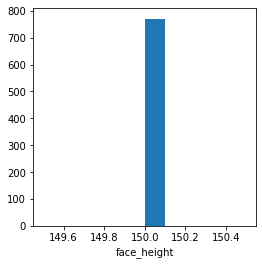

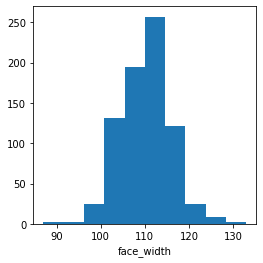

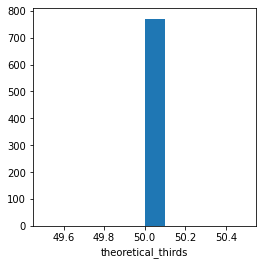

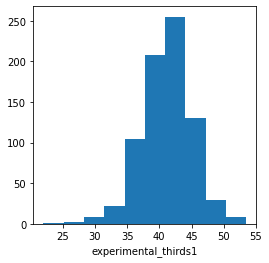

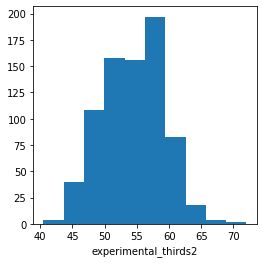

...

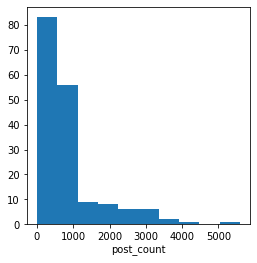

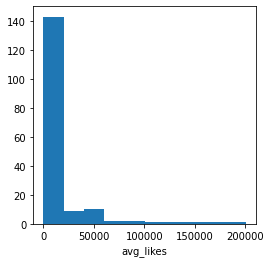

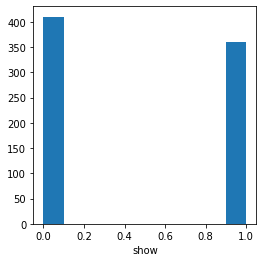

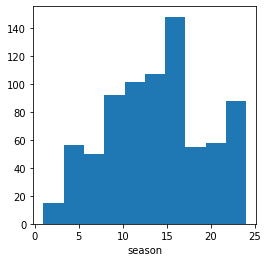

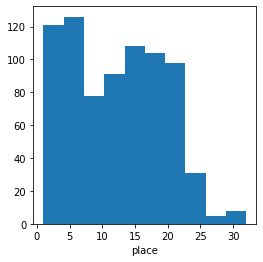

In [14]:
# Histograms to show distribution

def draw_hist(x, x_label):
    plt.figure(figsize=(4,4))
    plt.xlabel(x_label)
    plt.hist(x)
    plt.show()

cols = [col for col in dfall.columns.values if dfall[col].dtypes != 'object']
for col in cols:
    draw_hist(dfall[col], col)

#dfall.hist(figsize=(16,18), color='red')

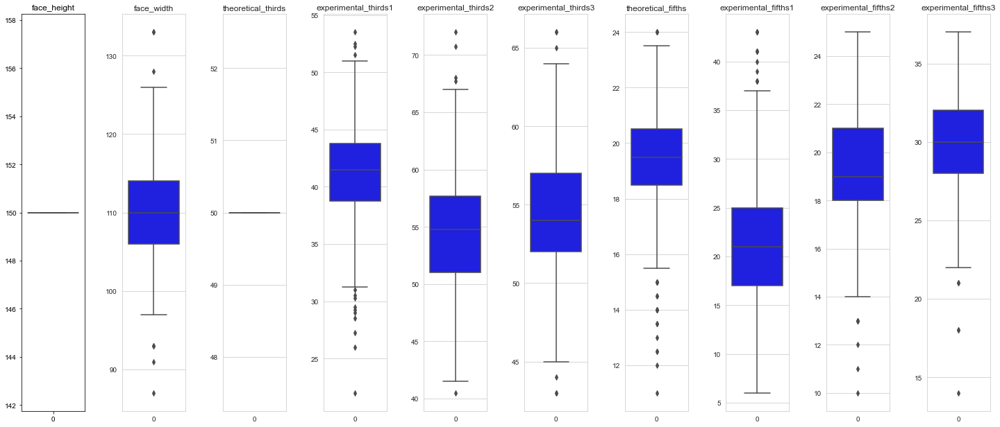

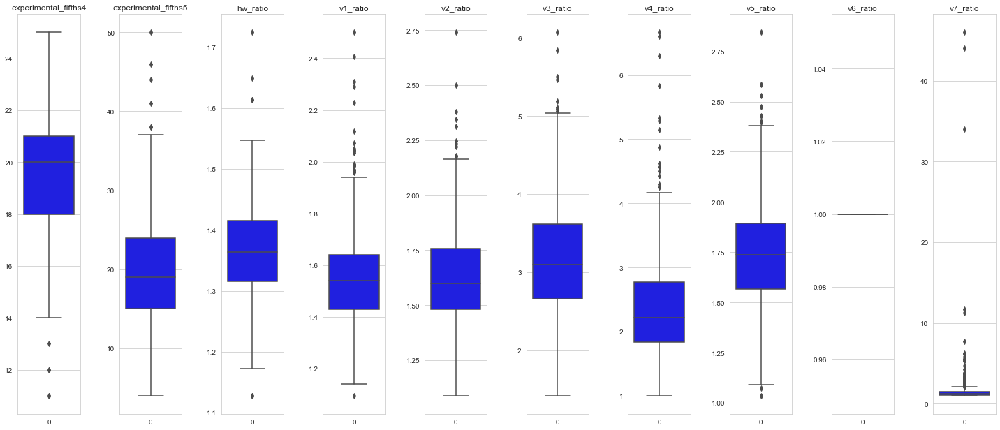

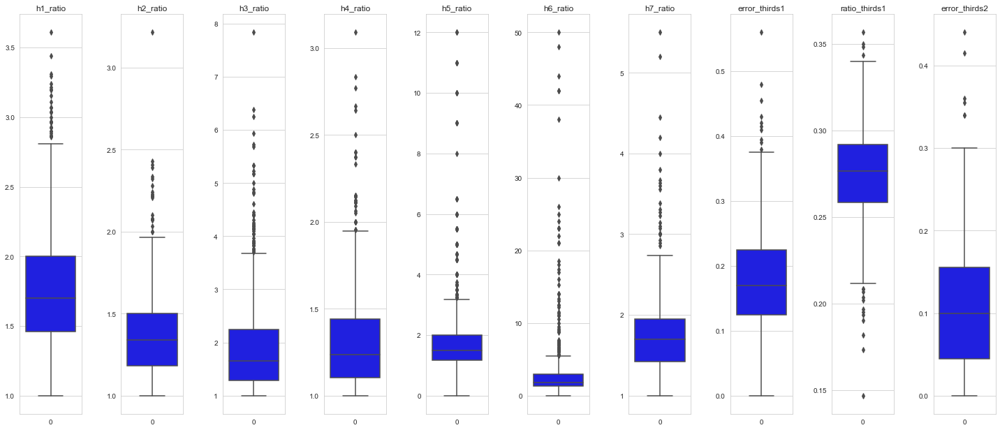

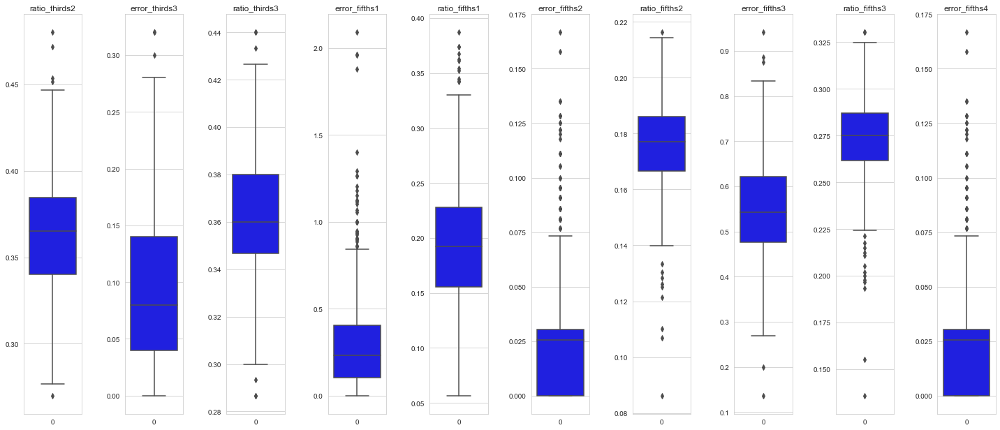

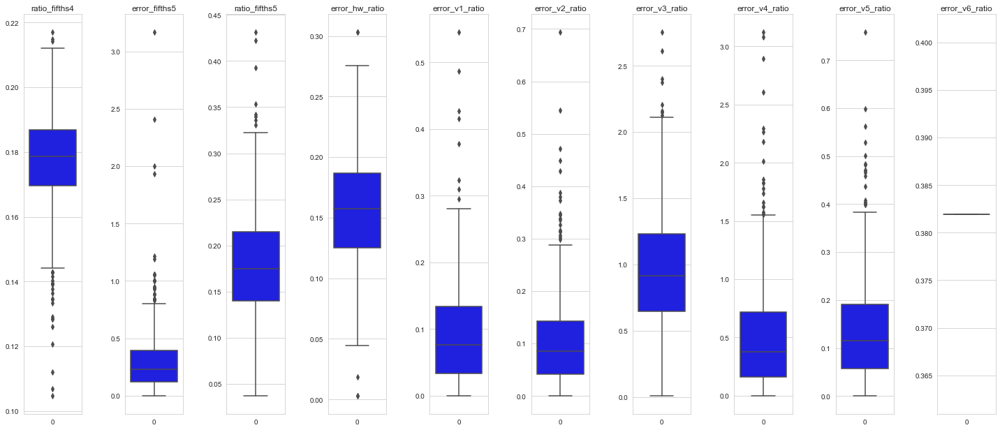

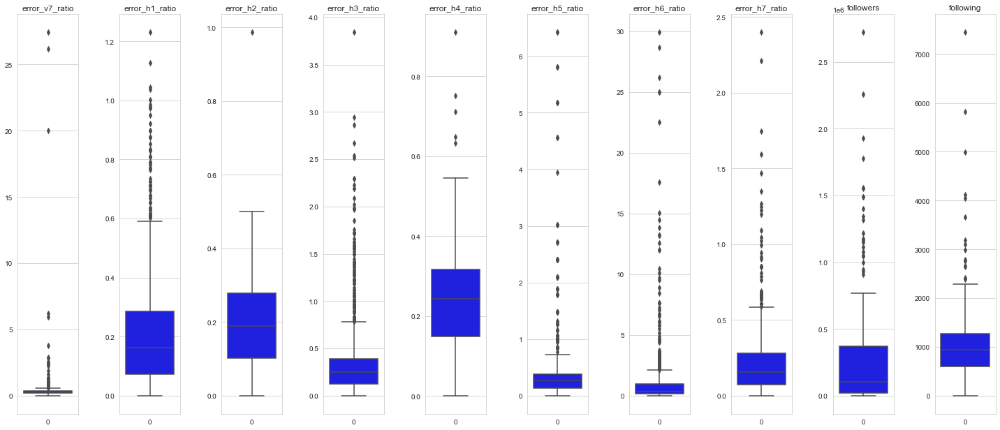

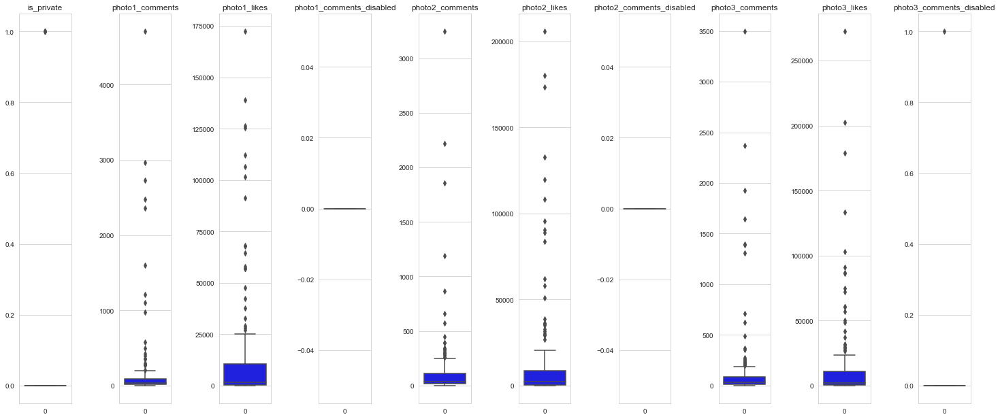

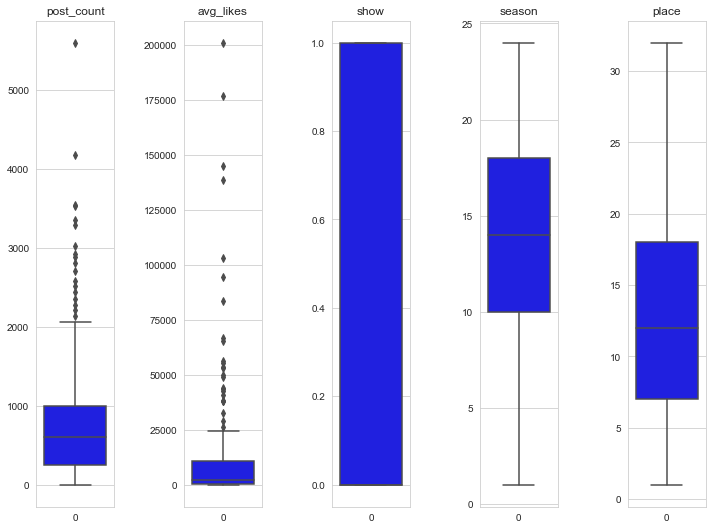

In [15]:
# Boxplots to show spread

def boxplot_row(df, cols):
    num_rows = len(cols)-1//len(cols)
    plt.figure(figsize=(len(cols)*2, 10*num_rows))
    for i in range(0,len(cols)):
        plt.subplot(num_rows+2, len(cols), i+1)
        sns.set_style('whitegrid')
        sns.boxplot(data=df[cols[i]], color='blue', orient='v').set_title(cols[i])
        plt.tight_layout(w_pad=3)

cols = [col for col in dfall.columns.values if dfall[col].dtypes != 'object']
for i in range(0,len(cols)//10):
    boxplot_row(dfall, cols[i*10:(i*10)+10])
if len(cols)%10 != 0:
    boxplot_row(dfall, cols[-(len(cols)%10):])

#### All contestants' correlation to place:

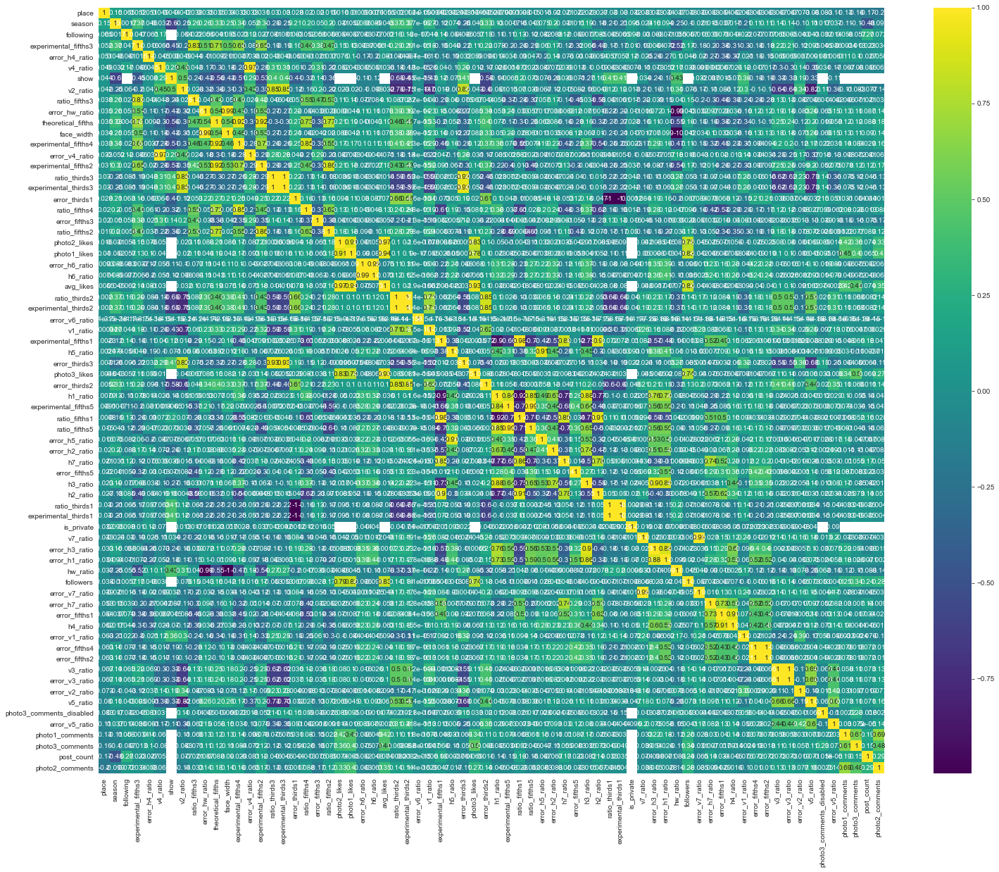

In [16]:
# Correlation Matrix

def draw_corrmatrix(df, col_name):
    k = len(df.columns.values)
    cols = df.corr().nlargest(k, col_name)[col_name].index
    cm = df[cols].corr()
    plt.figure(figsize=(25,20))
    sns.heatmap(cm, annot=True, cmap='viridis')

draw_corrmatrix(dfall, 'place')

#### Bachelor contestants' correlation to place:

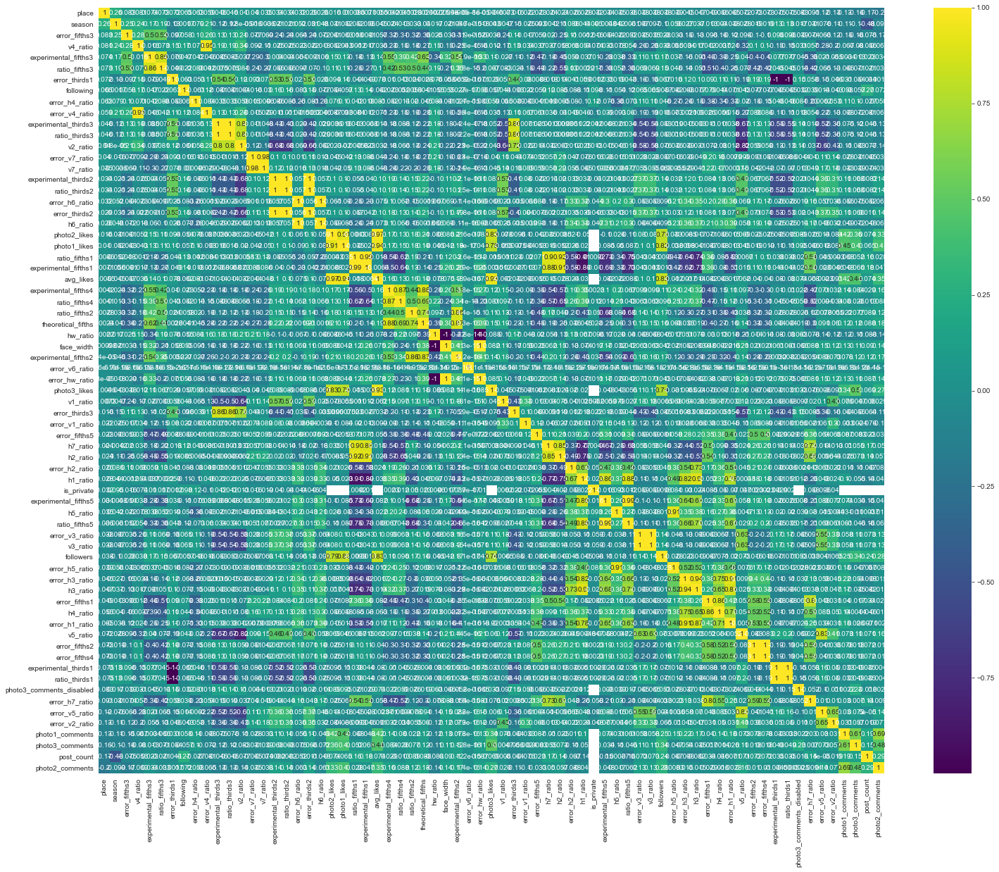

In [17]:
# Separate contestants by show, and check correlation matrix

bachelor_df = dfall[dfall['show'] == 0]
draw_corrmatrix(bachelor_df, 'place')

#### Bachelorette contestants' correlation to place:

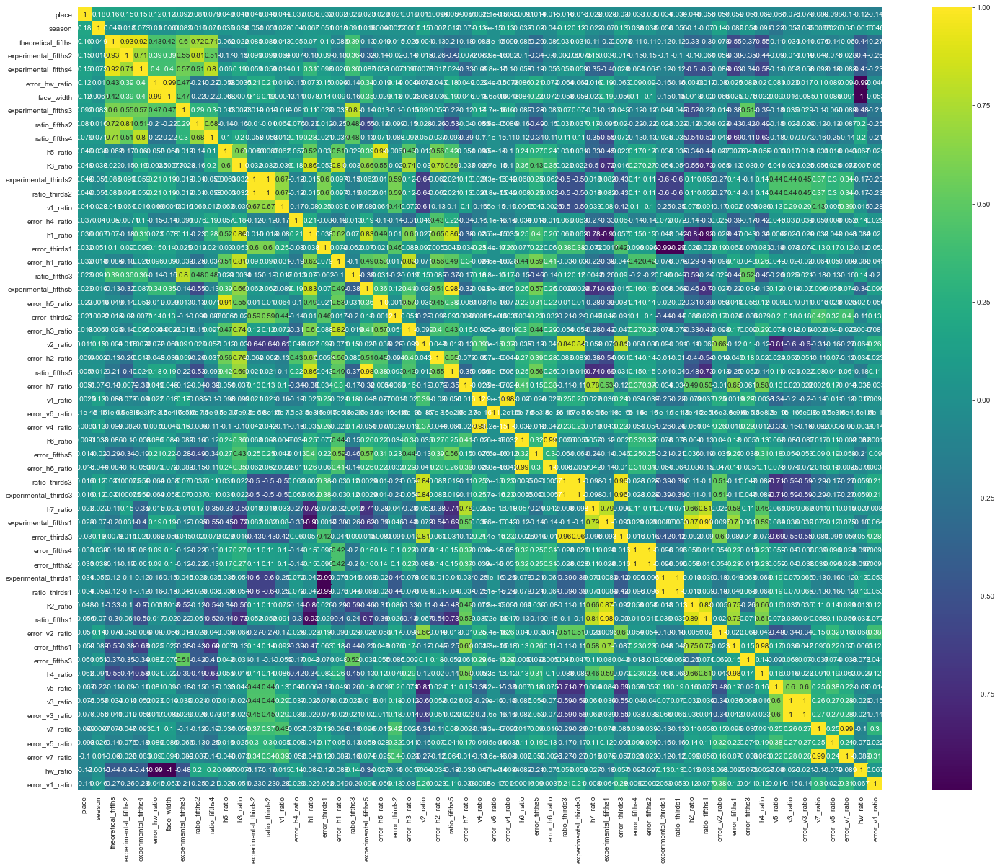

In [18]:
bachelorette_df = dfall[dfall['show'] == 1]
draw_corrmatrix(bachelorette_df, 'place')

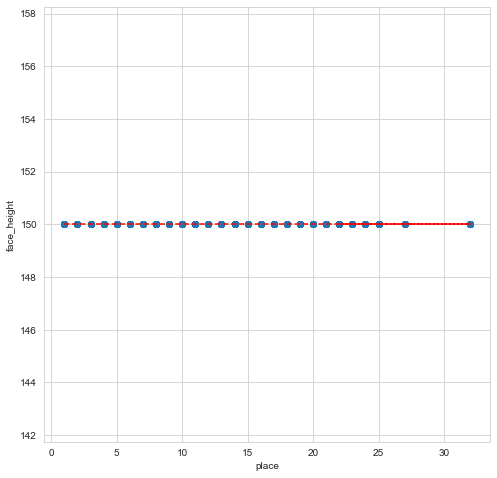

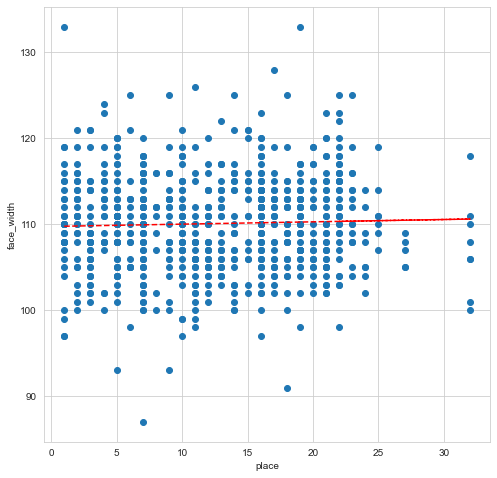

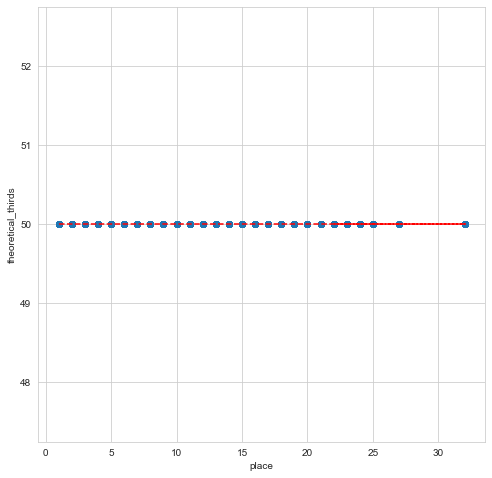

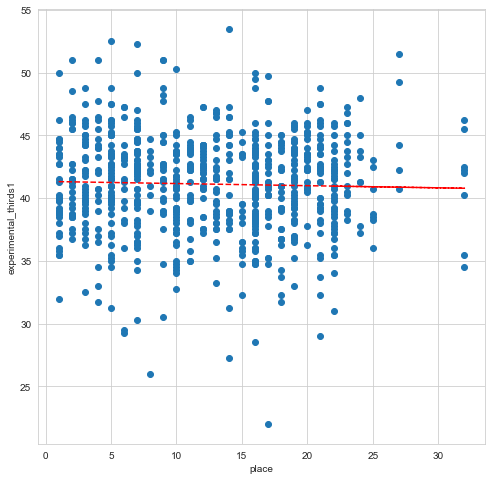

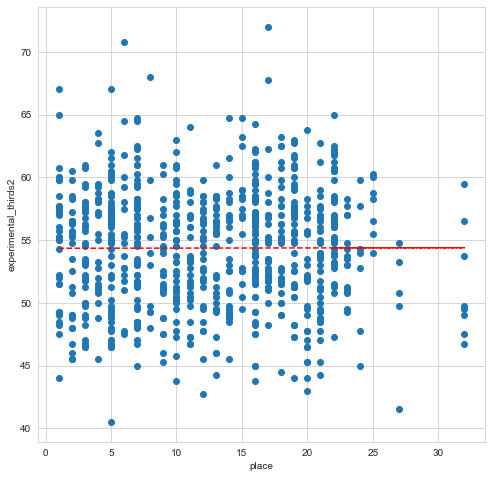

...

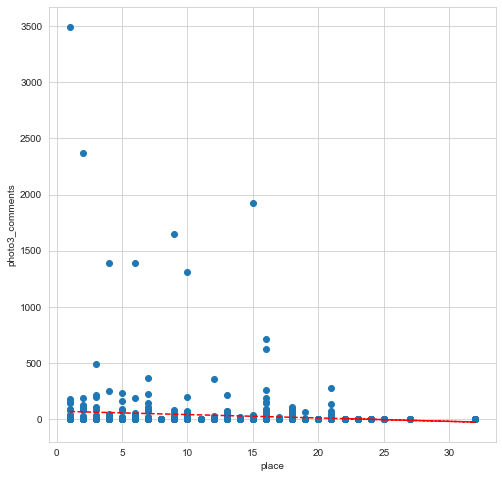

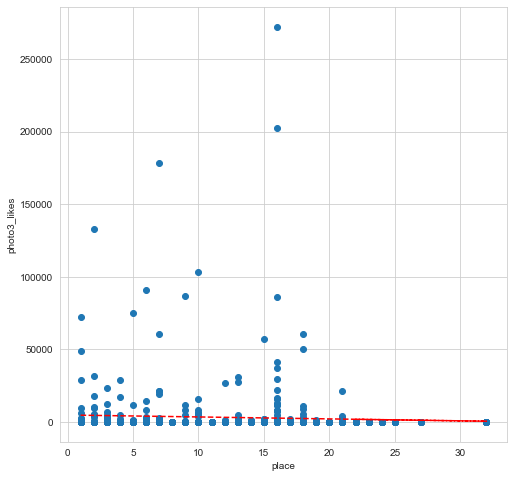

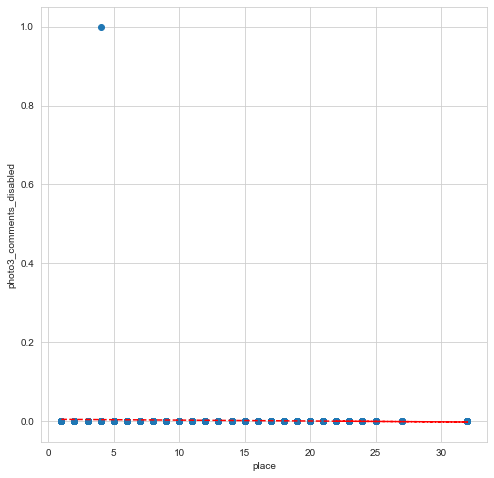

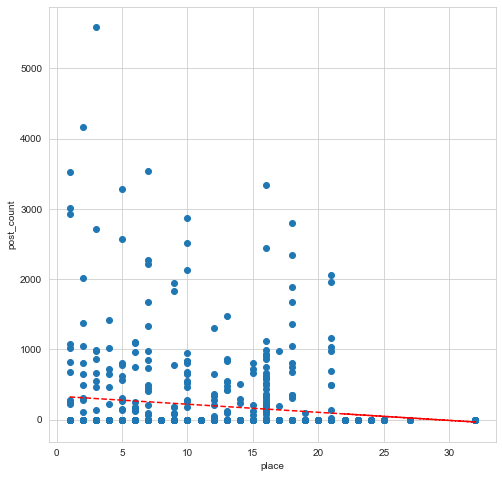

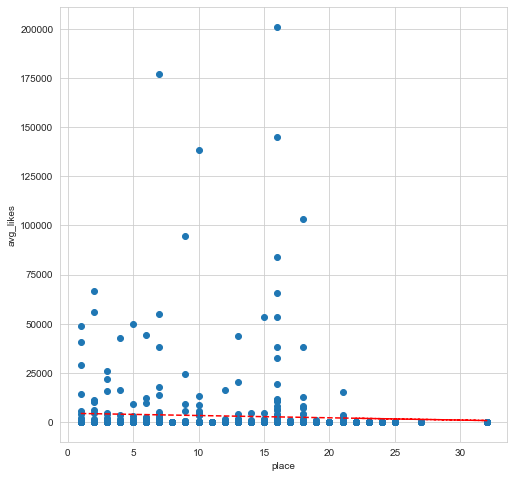

In [25]:
# Draw scatter plots with trend lines

def draw_scatter(x, y, x_label, y_label):
    plt.figure(figsize=(8,8))
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.scatter(x, y)
    z = np.polyfit(x, y, 1)
    p = np.poly1d(z)
    plt.plot(x, p(x), 'r--')
    plt.show()

# Replace NaN values with 0
dfall.fillna(0, inplace=True)

cols = [col for col in dfall.columns.values if dfall[col].dtypes != 'object']
for col in cols:
    if col not in ['place', 'season', 'show']:
        draw_scatter(dfall['place'], dfall[col], 'place', col)

#### Attractiveness correlation to Instagram followers

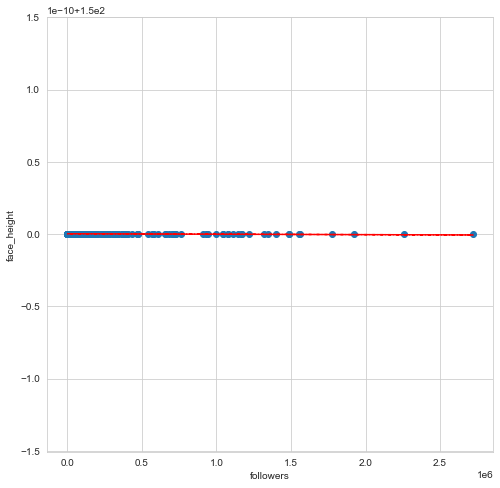

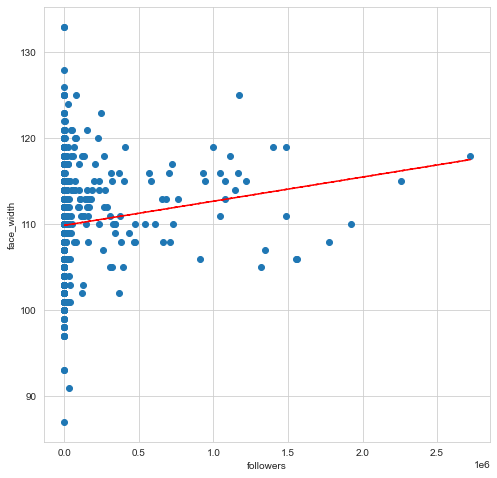

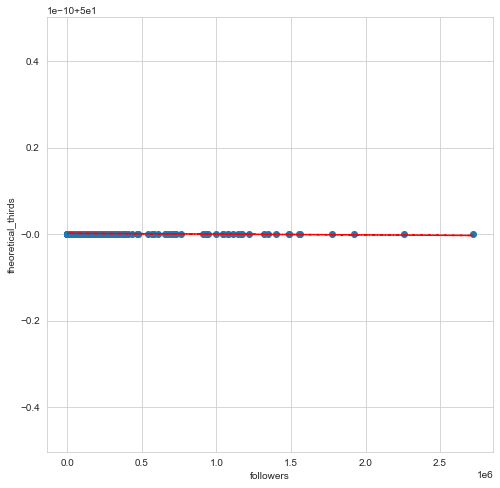

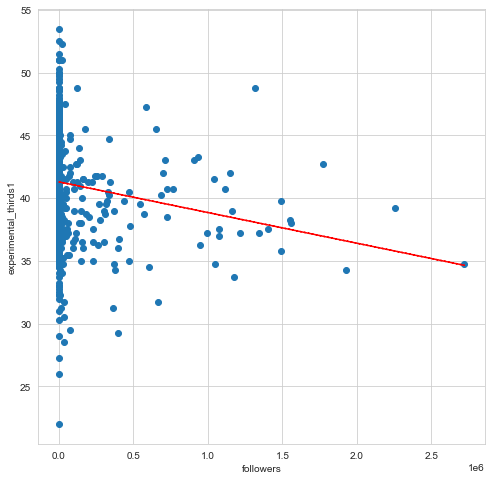

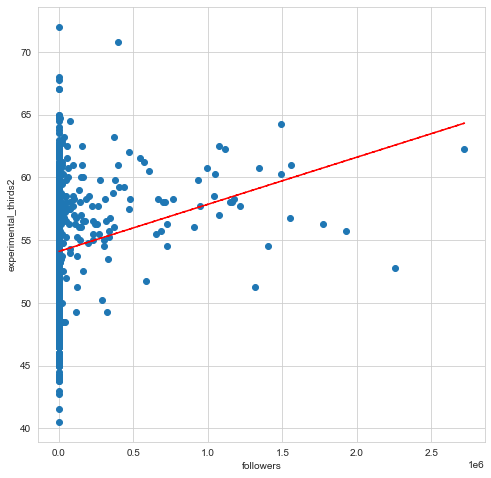

...

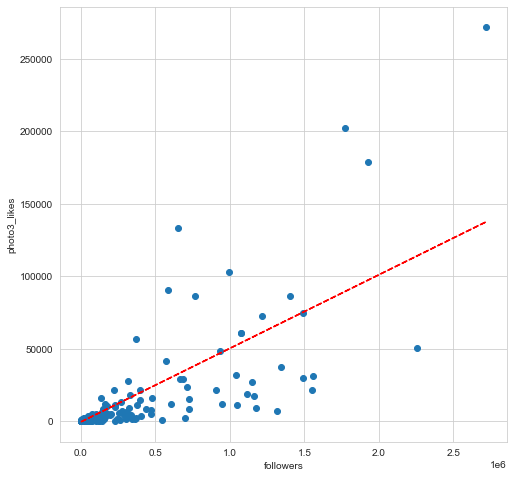

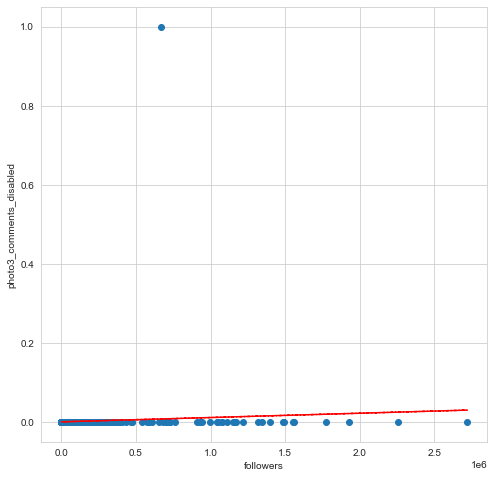

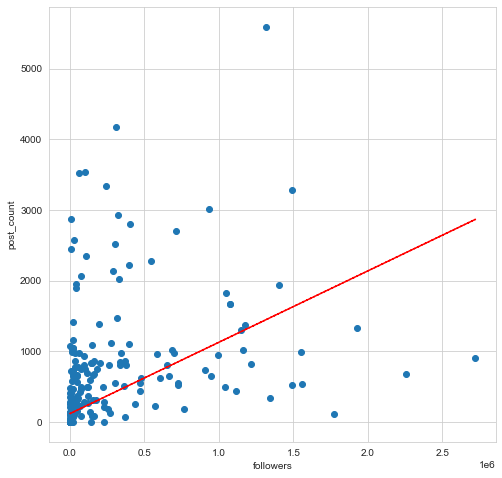

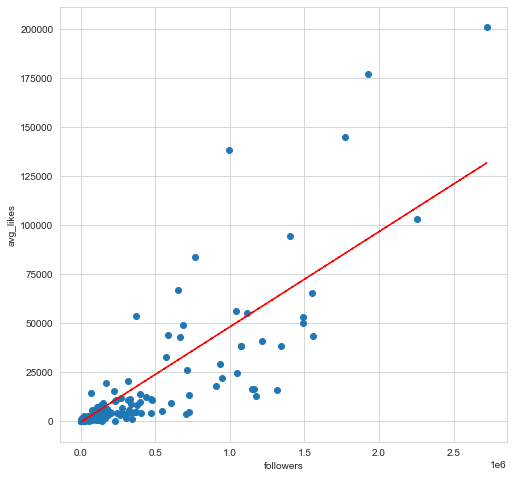

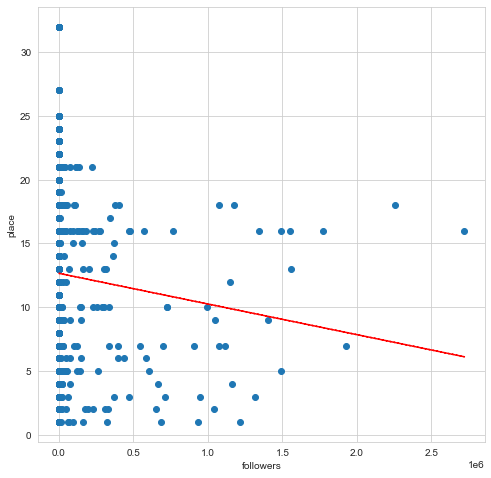

In [26]:
cols = [col for col in dfall.columns.values if dfall[col].dtypes != 'object']
for col in cols:
    if col not in ['followers', 'season', 'show']:
        draw_scatter(dfall['followers'], dfall[col], 'followers', col)

#### Attractiveness correlation to Instagram average likes of three photos

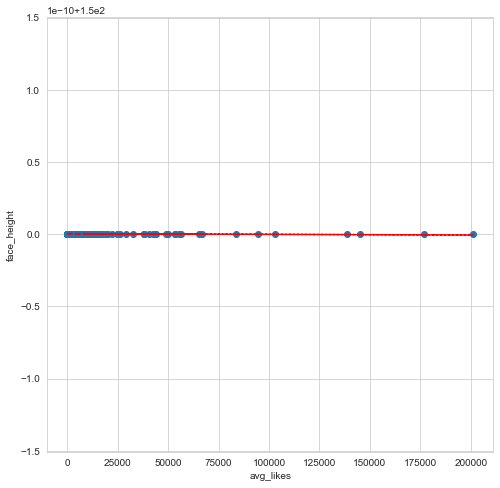

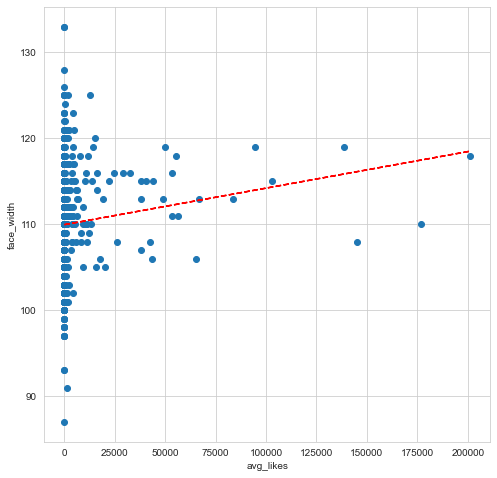

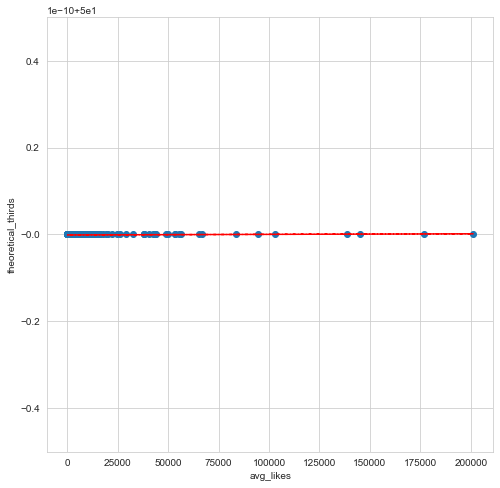

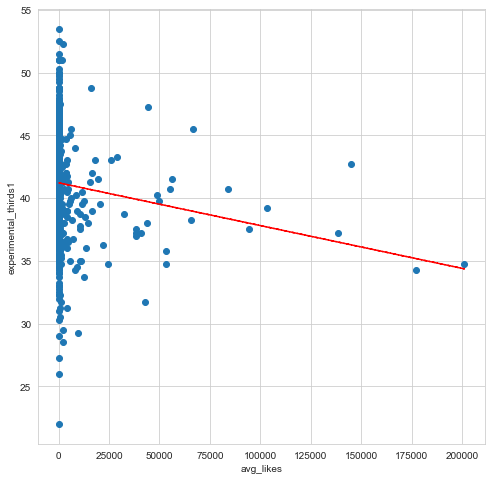

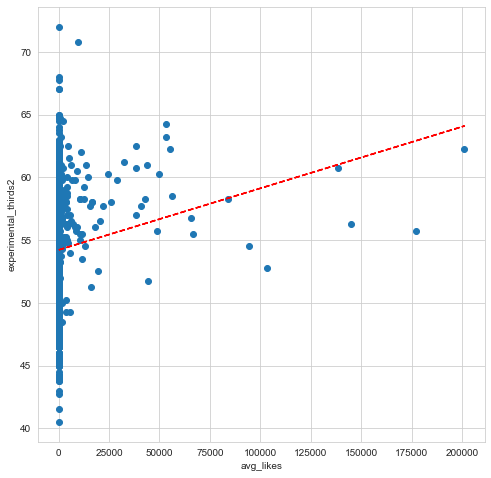

...

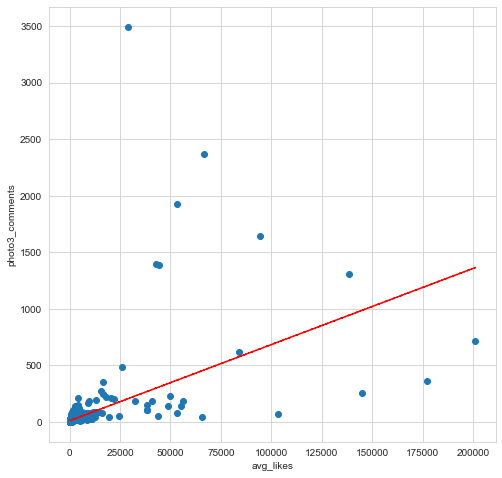

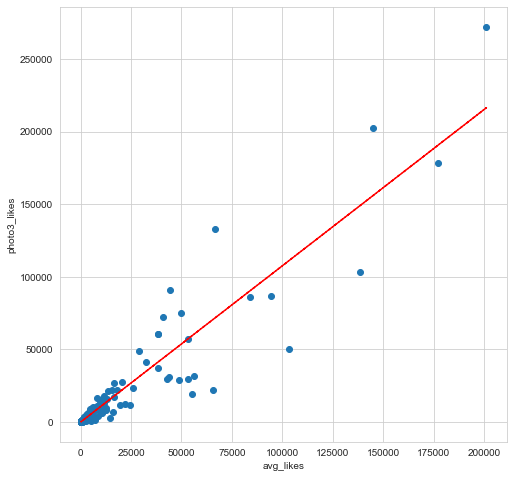

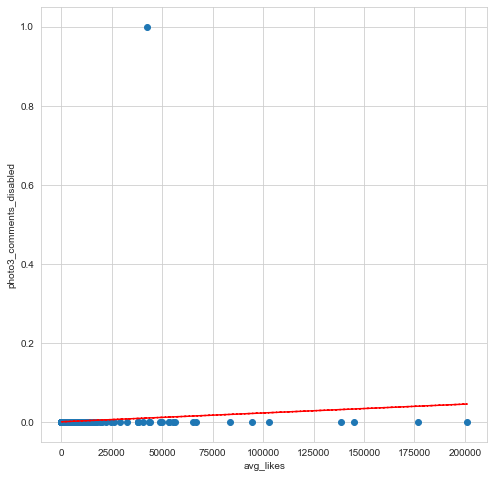

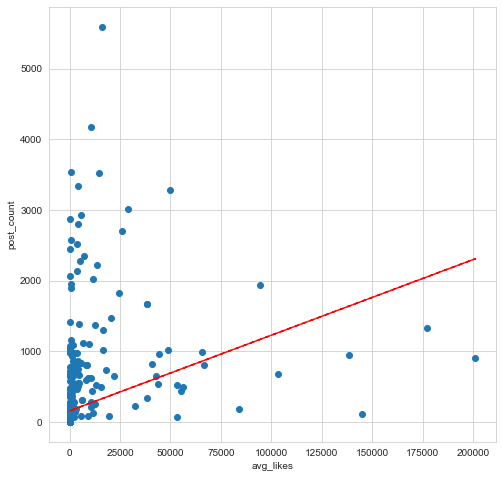

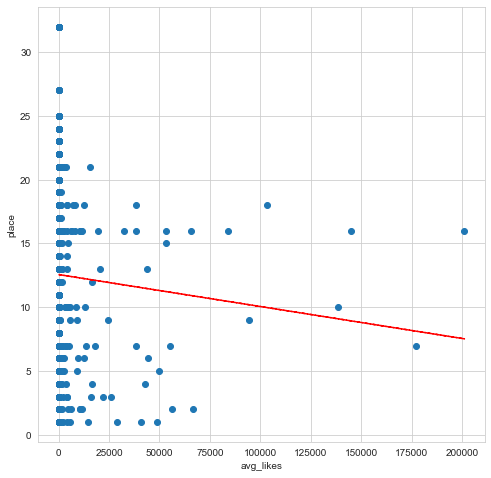

In [42]:
cols = [col for col in dfall.columns.values if dfall[col].dtypes != 'object']
for col in cols:
    if col not in ['avg_likes', 'season', 'show']:
        draw_scatter(dfall['avg_likes'], dfall[col], 'avg_likes', col)

### Observations

* Some missing data in data set 4. This is most likely due to private accounts or less than three photo posts.
* There is more missing height and social media data in data set 3 than not
* Some age and hometown data is missing in data sets 2 and 3
* The distributions of error_thirds2, error_thirds3, error_fifths1, error_fifths2, error_v1_ratio, error_v2_ratio, error_v4_ratio, error_v5_ratio, error_h1_ratio, error_h3_ratio, and error_h7_ratio are irregular and they are all positively skewed
* Most of the social media data distribution is irregular and also positively skewed
* Significant outliers also exist in all of the percentage errors results except for error_v6_ratio
* Significant outliers also exist in photo1_likes, photo2_likes, photo3_likes, and interestingly the overall spread of these variables looks similar
* Significant outliers also exist in photo1_comments, photo2_comments, photo3_comments, and interestingly the overall spread of these variables looks similar
* No significant correlation seems to exist between place and any of the other variables
* Separating the data by show (and therefore by gender) did also not reveal any correlation between place and any of the other variables
* Some correlation seems to exist between followers and attractiveness variables, specifically the results of the rule of thirds
* Some correlation seems to exist between average photo likes and attractiveness variables, specifically the results of the rule of thirds